# FFT Round-Trip: Image → Frequency Domain → Image

Demonstrates that the FFT is perfectly invertible when you keep both **magnitude and phase**.
Shows the log-power spectrum (what our CNN sees) alongside the phase, and reconstructs
the original image via inverse FFT.

In [11]:
import sys, os
sys.path.insert(0, os.path.join(os.getcwd(), '..'))

import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from src.transforms import to_grayscale_array

img1 = Image.open('../1.png')
img2 = Image.open('../2.png')

gray1 = to_grayscale_array(img1, size=224)
gray2 = to_grayscale_array(img2, size=224)

print(f'Image 1: {img1.size} → grayscale {gray1.shape}')
print(f'Image 2: {img2.size} → grayscale {gray2.shape}')

Image 1: (1360, 1740) → grayscale (224, 224)
Image 2: (1374, 1694) → grayscale (224, 224)


In [12]:
def fft_decompose(gray):
    """FFT a grayscale image, return shifted magnitude, phase, and log-power spectrum."""
    F = np.fft.fft2(gray)
    F_shifted = np.fft.fftshift(F)
    magnitude = np.abs(F_shifted)
    phase = np.angle(F_shifted)
    log_power = np.log1p(magnitude ** 2).astype(np.float32)
    return F_shifted, magnitude, phase, log_power

def fft_reconstruct(magnitude, phase):
    """Reconstruct image from magnitude and phase."""
    F_shifted = magnitude * np.exp(1j * phase)
    F = np.fft.ifftshift(F_shifted)
    return np.real(np.fft.ifft2(F))

F1, mag1, phase1, lps1 = fft_decompose(gray1)
F2, mag2, phase2, lps2 = fft_decompose(gray2)

recon1 = fft_reconstruct(mag1, phase1)
recon2 = fft_reconstruct(mag2, phase2)

err1 = np.max(np.abs(gray1 - recon1))
err2 = np.max(np.abs(gray2 - recon2))
print(f'Max reconstruction error (1.png): {err1:.2e}')
print(f'Max reconstruction error (2.png): {err2:.2e}')

Max reconstruction error (1.png): 4.58e-05
Max reconstruction error (2.png): 6.10e-05


## Full pipeline for both images

Each row: Original → Grayscale → Log-Power Spectrum → Phase → Reconstructed

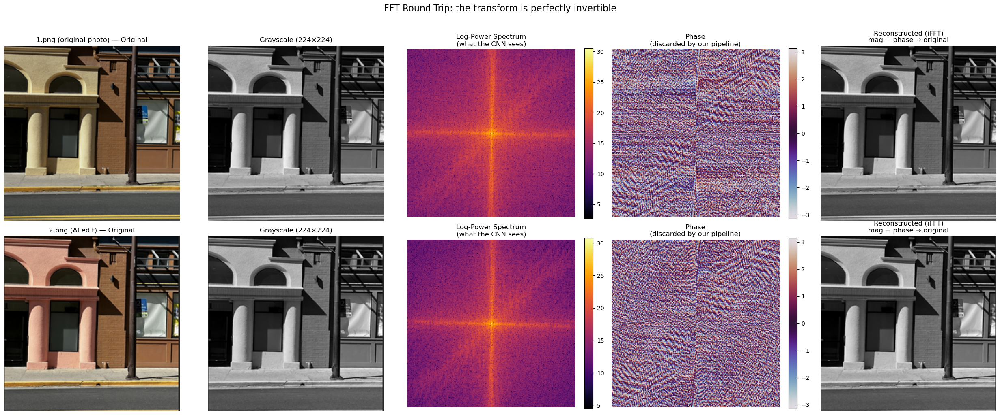

In [13]:
fig, axes = plt.subplots(2, 5, figsize=(25, 10))

for row, (img, gray, lps, phase, recon, name) in enumerate([
    (img1, gray1, lps1, phase1, recon1, '1.png (original photo)'),
    (img2, gray2, lps2, phase2, recon2, '2.png (AI edit)'),
]):
    axes[row, 0].imshow(img.resize((224, 224), Image.LANCZOS))
    axes[row, 0].set_title(f'{name} — Original')

    axes[row, 1].imshow(gray, cmap='gray')
    axes[row, 1].set_title('Grayscale (224×224)')

    im_lps = axes[row, 2].imshow(lps, cmap='inferno')
    axes[row, 2].set_title('Log-Power Spectrum\n(what the CNN sees)')
    plt.colorbar(im_lps, ax=axes[row, 2], fraction=0.046)

    im_ph = axes[row, 3].imshow(phase, cmap='twilight', vmin=-np.pi, vmax=np.pi)
    axes[row, 3].set_title('Phase\n(discarded by our pipeline)')
    plt.colorbar(im_ph, ax=axes[row, 3], fraction=0.046)

    axes[row, 4].imshow(recon, cmap='gray')
    axes[row, 4].set_title('Reconstructed (iFFT)\nmag + phase → original')

for ax in axes.ravel():
    ax.axis('off')

plt.suptitle('FFT Round-Trip: the transform is perfectly invertible', fontsize=16, y=1.02)
plt.tight_layout()
plt.savefig('../figures/fft_roundtrip.png', dpi=150, bbox_inches='tight')
plt.show()

## Spectral residual: real photo vs AI edit

1.png is the original photograph. 2.png is an AI-generated edit that changed the wall color.
The residual (Original − AI edit) captures two things mixed together:
- **Low frequencies (center):** the color change itself (different grayscale brightness)
- **Mid/high frequencies (further from center):** AI artifacts — the generator smoothing textures, altering detail, or introducing periodic patterns beyond what a simple recolor would produce

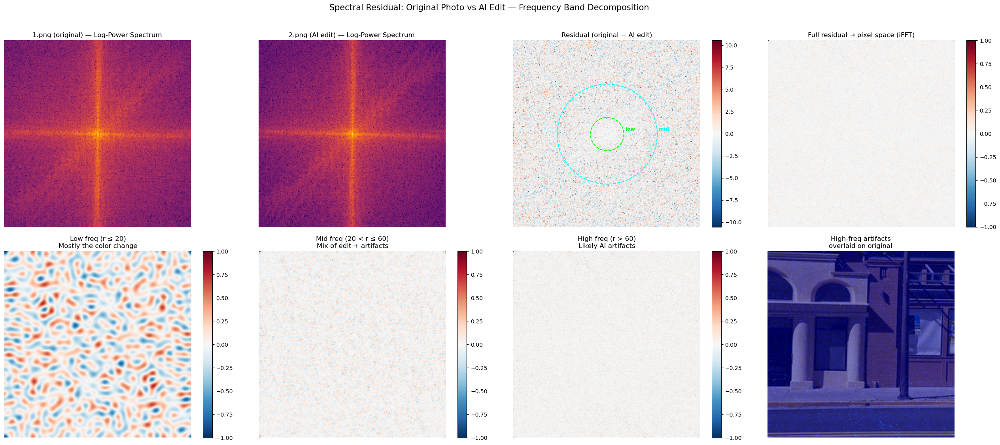

Residual range: [-10.220, 10.546]
Energy by band:
  Low  (r ≤ 20): 1.0%  ← color change
  Mid  (20 < r ≤ 60): 18.1%  ← edit + artifacts
  High (r > 60): 80.9%  ← likely AI artifacts


In [14]:
residual = lps1 - lps2

H, W = residual.shape
cy, cx = H // 2, W // 2
y, x = np.ogrid[:H, :W]
r = np.sqrt((x - cx)**2 + (y - cy)**2)

r_low = 20
r_mid = 60

low_mask = r <= r_low
mid_mask = (r > r_low) & (r <= r_mid)
high_mask = r > r_mid

residual_low = residual * low_mask
residual_mid = residual * mid_mask
residual_high = residual * high_mask

# --- Row 1: spectra + annotated residual ---
fig, axes = plt.subplots(2, 4, figsize=(26, 11))

axes[0, 0].imshow(lps1, cmap='inferno')
axes[0, 0].set_title('1.png (original) — Log-Power Spectrum')
axes[0, 0].axis('off')

axes[0, 1].imshow(lps2, cmap='inferno')
axes[0, 1].set_title('2.png (AI edit) — Log-Power Spectrum')
axes[0, 1].axis('off')

vlim = np.abs(residual).max()
im2 = axes[0, 2].imshow(residual, cmap='RdBu_r', vmin=-vlim, vmax=vlim)
axes[0, 2].set_title('Residual (original − AI edit)')
axes[0, 2].axis('off')
plt.colorbar(im2, ax=axes[0, 2], fraction=0.046)
circle_low = plt.Circle((cx, cy), r_low, fill=False, ec='lime', lw=1.5, ls='--')
circle_mid = plt.Circle((cx, cy), r_mid, fill=False, ec='cyan', lw=1.5, ls='--')
axes[0, 2].add_patch(circle_low)
axes[0, 2].add_patch(circle_mid)
axes[0, 2].text(cx + r_low + 2, cy - 4, 'low', color='lime', fontsize=9, fontweight='bold')
axes[0, 2].text(cx + r_mid + 2, cy - 4, 'mid', color='cyan', fontsize=9, fontweight='bold')

residual_spatial = np.real(np.fft.ifft2(np.fft.ifftshift(residual)))
rs_norm = residual_spatial / np.abs(residual_spatial).max()
im3 = axes[0, 3].imshow(rs_norm, cmap='RdBu_r', vmin=-1, vmax=1)
axes[0, 3].set_title('Full residual → pixel space (iFFT)')
axes[0, 3].axis('off')
plt.colorbar(im3, ax=axes[0, 3], fraction=0.046)

# --- Row 2: band-separated residuals mapped to pixel space ---
spatial_low = np.real(np.fft.ifft2(np.fft.ifftshift(residual_low)))
spatial_mid = np.real(np.fft.ifft2(np.fft.ifftshift(residual_mid)))
spatial_high = np.real(np.fft.ifft2(np.fft.ifftshift(residual_high)))

for col, (sp, title) in enumerate([
    (spatial_low, f'Low freq (r ≤ {r_low})\nMostly the color change'),
    (spatial_mid, f'Mid freq ({r_low} < r ≤ {r_mid})\nMix of edit + artifacts'),
    (spatial_high, f'High freq (r > {r_mid})\nLikely AI artifacts'),
]):
    sp_norm = sp / max(np.abs(sp).max(), 1e-10)
    im = axes[1, col].imshow(sp_norm, cmap='RdBu_r', vmin=-1, vmax=1)
    axes[1, col].set_title(title)
    axes[1, col].axis('off')
    plt.colorbar(im, ax=axes[1, col], fraction=0.046)

axes[1, 3].imshow(img1.resize((224, 224), Image.LANCZOS))
axes[1, 3].imshow(np.abs(spatial_high) / max(np.abs(spatial_high).max(), 1e-10),
                  cmap='jet', alpha=0.5)
axes[1, 3].set_title('High-freq artifacts\noverlaid on original')
axes[1, 3].axis('off')

plt.suptitle('Spectral Residual: Original Photo vs AI Edit — Frequency Band Decomposition', fontsize=15, y=1.02)
plt.tight_layout()
plt.savefig('../figures/fft_residual_annotated.png', dpi=150, bbox_inches='tight')
plt.show()

energy_low = np.sum(residual_low**2)
energy_mid = np.sum(residual_mid**2)
energy_high = np.sum(residual_high**2)
energy_total = energy_low + energy_mid + energy_high
print(f'Residual range: [{residual.min():.3f}, {residual.max():.3f}]')
print(f'Energy by band:')
print(f'  Low  (r ≤ {r_low:2d}): {energy_low/energy_total:.1%}  ← color change')
print(f'  Mid  ({r_low} < r ≤ {r_mid}): {energy_mid/energy_total:.1%}  ← edit + artifacts')
print(f'  High (r > {r_mid:2d}): {energy_high/energy_total:.1%}  ← likely AI artifacts')

## Reconstruction from log-power spectrum only (no phase)

This is what our pipeline throws away. The log-power spectrum stores `log(1 + |F|²)`.
To recover magnitude: `|F| = sqrt(exp(S) - 1)`. With zero phase, we get a symmetric
blob — no spatial structure. This is what the CNN classifies: energy distribution, not image content.

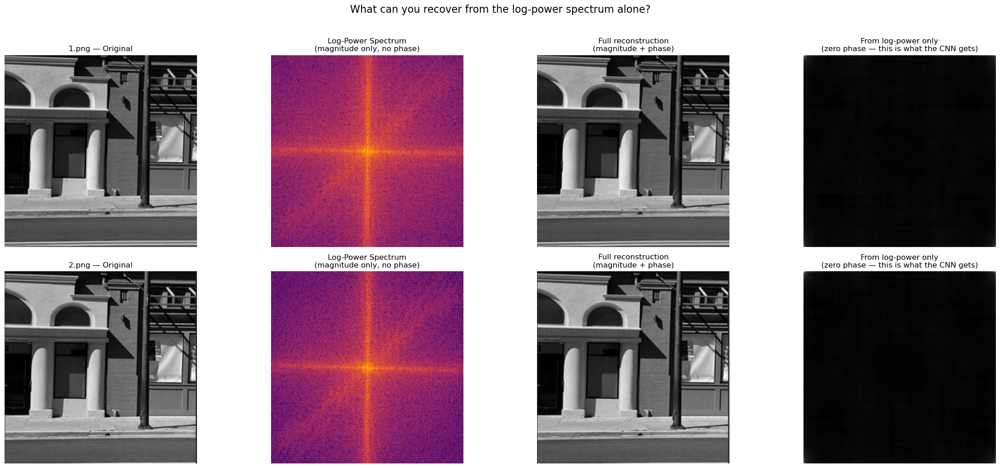

In [15]:
def reconstruct_from_log_power(log_power_spectrum):
    """Recover magnitude from log-power, assume zero phase, inverse FFT."""
    magnitude = np.sqrt(np.expm1(log_power_spectrum))
    F_shifted = magnitude  # zero phase → all real, no imaginary component
    F = np.fft.ifftshift(F_shifted)
    return np.real(np.fft.ifft2(F))

recon1_from_lps = reconstruct_from_log_power(lps1)
recon2_from_lps = reconstruct_from_log_power(lps2)

fig, axes = plt.subplots(2, 4, figsize=(24, 10))

for row, (gray, lps, recon_full, recon_lps, name) in enumerate([
    (gray1, lps1, recon1, recon1_from_lps, '1.png'),
    (gray2, lps2, recon2, recon2_from_lps, '2.png'),
]):
    axes[row, 0].imshow(gray, cmap='gray')
    axes[row, 0].set_title(f'{name} — Original')

    axes[row, 1].imshow(lps, cmap='inferno')
    axes[row, 1].set_title('Log-Power Spectrum\n(magnitude only, no phase)')

    axes[row, 2].imshow(recon_full, cmap='gray')
    axes[row, 2].set_title('Full reconstruction\n(magnitude + phase)')

    axes[row, 3].imshow(recon_lps, cmap='gray')
    axes[row, 3].set_title('From log-power only\n(zero phase — this is what the CNN gets)')

for ax in axes.ravel():
    ax.axis('off')

plt.suptitle('What can you recover from the log-power spectrum alone?', fontsize=16, y=1.02)
plt.tight_layout()
plt.savefig('../figures/fft_log_power_only.png', dpi=150, bbox_inches='tight')
plt.show()

## What happens without phase?

If we reconstruct using only the magnitude (zero phase), we lose all spatial structure.
This shows **phase carries the structural information**, while magnitude carries the texture/energy distribution.

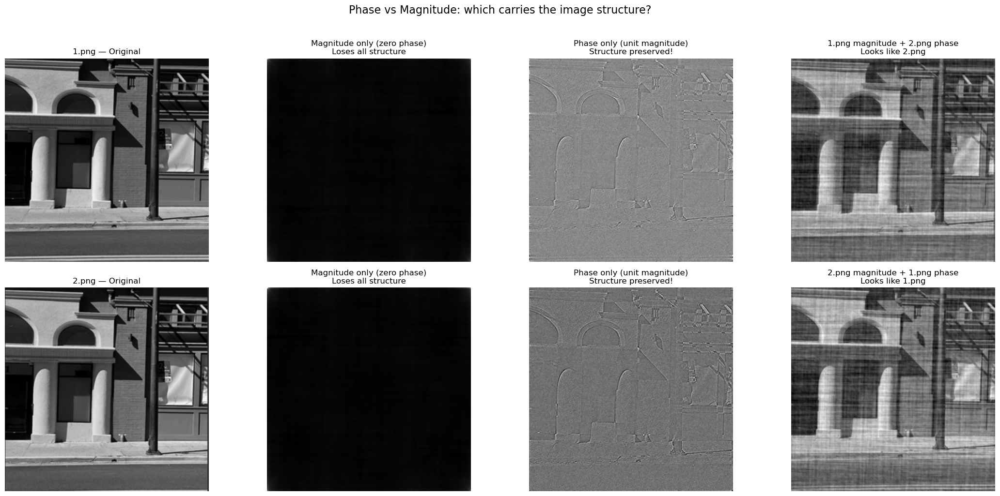

In [16]:
recon1_no_phase = fft_reconstruct(mag1, np.zeros_like(phase1))
recon2_no_phase = fft_reconstruct(mag2, np.zeros_like(phase2))

recon1_no_mag = fft_reconstruct(np.ones_like(mag1), phase1)
recon2_no_mag = fft_reconstruct(np.ones_like(mag2), phase2)

recon_swap_phase = fft_reconstruct(mag1, phase2)
recon_swap_mag = fft_reconstruct(mag2, phase1)

fig, axes = plt.subplots(2, 4, figsize=(22, 10))

axes[0, 0].imshow(gray1, cmap='gray')
axes[0, 0].set_title('1.png — Original')
axes[0, 1].imshow(recon1_no_phase, cmap='gray')
axes[0, 1].set_title('Magnitude only (zero phase)\nLoses all structure')
axes[0, 2].imshow(recon1_no_mag, cmap='gray')
axes[0, 2].set_title('Phase only (unit magnitude)\nStructure preserved!')
axes[0, 3].imshow(recon_swap_phase, cmap='gray')
axes[0, 3].set_title('1.png magnitude + 2.png phase\nLooks like 2.png')

axes[1, 0].imshow(gray2, cmap='gray')
axes[1, 0].set_title('2.png — Original')
axes[1, 1].imshow(recon2_no_phase, cmap='gray')
axes[1, 1].set_title('Magnitude only (zero phase)\nLoses all structure')
axes[1, 2].imshow(recon2_no_mag, cmap='gray')
axes[1, 2].set_title('Phase only (unit magnitude)\nStructure preserved!')
axes[1, 3].imshow(recon_swap_mag, cmap='gray')
axes[1, 3].set_title('2.png magnitude + 1.png phase\nLooks like 1.png')

for ax in axes.ravel():
    ax.axis('off')

plt.suptitle('Phase vs Magnitude: which carries the image structure?', fontsize=16, y=1.02)
plt.tight_layout()
plt.savefig('../figures/fft_phase_vs_magnitude.png', dpi=150, bbox_inches='tight')
plt.show()